In [1]:
import sys, os
import re
from collections import defaultdict
import numpy as np
import pandas as pd

%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')
from matplotlib.patches import Rectangle, Polygon
import seaborn as sns
sns.set_style('white')

import geneinfo as gi
gi.email('your@email.com')


# # for use on the cluster
# %env ftp_proxy http://proxy-default:3128

# %env http_proxy=http://proxy-default:3128
# %env https_proxy=http://proxy-default:3128
# %env ftp_proxy=http://proxy-default:3128
# %env ftps_proxy=http://proxy-default:3128

**In-house uliity for accessing gene lists in google spreadsheet:**

In [3]:
from math import sqrt
from itertools import zip_longest

def list_genes(words, ncols=None):
    n = len(words)
    col_width = max(map(len, words)) + 1
    if ncols is None:
        ncols = max(100//col_width, 1+sqrt(n/col_width))
    nrows = int(n/ncols) + 1
    rows = []
    for r in range(0, n, nrows):
        rows.append(words[r:r+nrows])
    for row in list(zip_longest(*rows, fillvalue='')):
        line = []
        for gene in row:
            line.append(gene.ljust(col_width))
        print(''.join(line))

def read_google_sheet():
    SHEET_ID = '1JSjSLuto3jqdEnnG7JqzeC_1pUZw76n7XueVAYrUOpk'
    SHEET_NAME = 'Sheet1'
    url = f'https://docs.google.com/spreadsheets/d/{SHEET_ID}/gviz/tq?tqx=out:csv&sheet={SHEET_NAME}'
    df = pd.read_csv(url, header=1, low_memory=False)
    return df.loc[:, [not x.startswith('Unnamed') for x in df.columns]]
    
def gene_list_names():
    df = read_google_sheet()
    return sorted(df.columns.tolist())

def gene_list(name):
    df = read_google_sheet()
    sr = df[name]
    return sr[~sr.isnull()]
    
gene_list_names()        

['accel_reg_simiiformes_br',
 'all_npx',
 'all_post_mei_expr',
 'ari_all',
 'ari_nonPUR',
 'ari_relate_AFR',
 'ari_relate_ASIA',
 'ari_relate_EUR',
 'ari_relate_PUR',
 'cDEG',
 'candidates',
 'ech75_regions',
 'ech90_regions',
 'expr_mod_xi_copynr_fibrobl',
 'expr_mod_xi_copynr_lcl',
 'gametologs',
 'hpa_brain_prot',
 'intel_seiz_lang',
 'intelect_disabil',
 'intersection(nDEG, matos_neuron)',
 'matos_common',
 'matos_common_no_xy_gametologs',
 'matos_neuron',
 'meritxell_spermatid_expr',
 'msci',
 'msci_esc',
 'mult_copy',
 'my_primate_codeml',
 'nDEG',
 'neuron_genome_proteome',
 'neuron_npx_proteome',
 'primate_ampl_multi',
 'reg_sa_pheno',
 'sfari_all_conf',
 'union(H,matos_common)',
 'xi',
 'xi_any_evidence',
 'xi_escape',
 'xi_uncertain']

In [4]:
xi_escape = gene_list('xi_escape')
list_genes(xi_escape)

AFF2    CDK16   EFNB1   GPR173  IKBKG   MAMLD1  OFD1    PPP2R3B SEPTIN6 TCEAL9  XG      
AKAP17A CDR1    EIF1AX  GPR174  IL3RA   MAP7D2  P2RY10  PQBP1   SLC25A6 TCEANC  XIST    
ALG13   CHM     EIF2S3  GTPBP6  IQSEC2  MED14   P2RY8   PRKX    SMC1A   TRAPPC2 XPNPEP2 
AP1S2   COX7B   FGF13   GYG2    JPX     MSL3    PDZD11  PUDP    SRPX    TXLNG   ZBED1   
ARSD    CXorf38 FHL1    HCFC1   KDM5C   MXRA5   PHKA1   RAB9A   STK26   UBA1    ZFX     
ASMTL   CXorf65 FOXO4   HEPH    KDM6A   NAA10   PLCXD1  RBBP7   STS     UBQLN2  ZRSR2   
CA5B    DDX3X   FUNDC1  HMGN5   LRCH2   NHS     PNPLA4  RPS4X   SYAP1   USP9X           
CD99    DHRSX   GEMIN8  HUWE1   MAGEE1  NHSL2   PORCN   SCML2   TASL    WAS             


**Left align in pandas tables:**

In [5]:
class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)
        
df = pd.DataFrame(dict(name=['A', 'B'], desc=['bla bla bla bla', 'bla']))
df

,name,desc
0,A,bla bla bla bla
1,B,bla


In [6]:
df << left()

,name,desc
0,A,bla bla bla bla
1,B,bla


In [7]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

# Summary gene information

**Using gene symbol:**

In [8]:
gi.gene_info('USP4')

**Symbol:** **_USP4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** UNP, Unph  
*ubiquitin specific peptidase 4*  
**Summary:** The protein encoded by this gene is a protease that deubiquitinates target proteins such as ADORA2A and TRIM21. The encoded protein shuttles between the nucleus and cytoplasm and is involved in maintaining operational fidelity in the endoplasmic reticulum. Three transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** 3:49277144-49340712 (hg38), 3:49315264-49378145 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=USP4)  


 ----

**Using NCBI ID:**

In [9]:
gi.gene_info(7157)

**Symbol:** **_TP53_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BCC7, BMFS5, LFS1, P53, TRP53  
*tumor protein p53*  
**Summary:** This gene encodes a tumor suppressor protein containing transcriptional activation, DNA binding, and oligomerization domains. The encoded protein responds to diverse cellular stresses to regulate expression of target genes, thereby inducing cell cycle arrest, apoptosis, senescence, DNA repair, or changes in metabolism. Mutations in this gene are associated with a variety of human cancers, including hereditary cancers such as Li-Fraumeni syndrome. Alternative splicing of this gene and the use of alternate promoters result in multiple transcript variants and isoforms. Additional isoforms have also been shown to result from the use of alternate translation initiation codons from identical transcript variants (PMIDs: 12032546, 20937277). [provided by RefSeq, Dec 2016].  
**Genomic position:** 17:7661779-7687546 (hg38), 17:7565097-7590856 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TP53)  


 ----

**For a a list of genes:**

In [10]:
gi.gene_info(['LARS2', 'XCR1'])

**Symbol:** **_LARS2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HLASA, LEURS, PRLTS4, mtLeuRS  
*leucyl-tRNA synthetase 2, mitochondrial*  
**Summary:** This gene encodes a class 1 aminoacyl-tRNA synthetase, mitochondrial leucyl-tRNA synthetase. Each of the twenty aminoacyl-tRNA synthetases catalyzes the aminoacylation of a specific tRNA or tRNA isoaccepting family with the cognate amino acid. [provided by RefSeq, Jul 2008].  
**Genomic position:** 3:45388561-45554726 (hg38), 3:45429998-45590913 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LARS2)  


 ----

**Symbol:** **_XCR1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CCXCR1, GPR5  
*X-C motif chemokine receptor 1*  
**Summary:** The protein encoded by this gene is a chemokine receptor belonging to the G protein-coupled receptor superfamily. The family members are characterized by the presence of 7 transmembrane domains. The encoded protein transduces a signal by increasing the intracellular calcium ion level. The viral macrophage inflammatory protein-II is an antagonist of this receptor and blocks signaling. Some studies have implicated a cluster of genes at 3p21.31, including this gene, as associated with COVID-19 risk. The encoded protein may also play a role in cell proliferation and migration in several types of cancer. [provided by RefSeq, Jan 2023].  
**Genomic position:** 3:46016990-46085825 (hg38), 3:46058516-46069234 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=XCR1)  


 ----

**For genes a region:**

In [11]:
gi.gene_info_region('chrX', 76500000, 77000000, assembly='hg19')

**Symbol:** **_FGF16_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** FGF-16, MF4  
*fibroblast growth factor 16*  
**Summary:** This gene encodes a member of a family of proteins that are involved in a variety of biological processes, including embryonic development, cell growth, morphogenesis, tissue repair, tumor growth and invasion. This gene is expressed in cardiac cells and is required for proper heart development. Mutation in this gene was also observed in individuals with metacarpal 4-5 fusion. [provided by RefSeq, Mar 2014].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FGF16)  


 ----

**Symbol:** **_ATRX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JMS, MRX52, RAD54, RAD54L, XH2, XNP, ZNF-HX  
*ATRX chromatin remodeler*  
**Summary:** The protein encoded by this gene contains an ATPase/helicase domain, and thus it belongs to the SWI/SNF family of chromatin remodeling proteins. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77504880-77786233 (hg38), HG1426_PATCH:76765832-77047170, X:76760356-77041702 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATRX)  


 ----

**Symbol:** **_ATRX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JMS, MRX52, RAD54, RAD54L, XH2, XNP, ZNF-HX  
*ATRX chromatin remodeler*  
**Summary:** The protein encoded by this gene contains an ATPase/helicase domain, and thus it belongs to the SWI/SNF family of chromatin remodeling proteins. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77504880-77786233 (hg38), HG1426_PATCH:76765832-77047170, X:76760356-77041702 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATRX)  


 ----

For species other than human:

In [12]:
gi.gene_info('DYNLT3', species='mouse', scopes=['mgi'])

**Symbol:** **_Dynlt3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 2310075M16Rik, Tcte1l  
*dynein light chain Tctex-type 3*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=Dynlt3)  


 ----

# Get the HGCN symbol for an alias

In [13]:
gi.hgcn_symbol(['CXorf23', 'BCLAF3'])

['BCLAF3', 'BCLAF3']

# Get coordinates for genes in a region

In [14]:
gi.get_genes_region('chrX', 76500000, 77000000, assembly='hg19')

[('FGF16',
  76709642,
  76712769,
  '+',
  [(76709642, 76709751), (76711767, 76712769)]),
 ('ATRX',
  76760357,
  77041702,
  '-',
  [(76760357, 76764107),
   (76776265, 76776394),
   (76776880, 76776976),
   (76777740, 76777866),
   (76778729, 76778879),
   (76812921, 76813116),
   (76814139, 76814317),
   (76829714, 76829823),
   (76845303, 76845410),
   (76849165, 76849319),
   (76854879, 76855049),
   (76855200, 76855289),
   (76855902, 76856033),
   (76872080, 76872198),
   (76874273, 76874449),
   (76875862, 76876000),
   (76888694, 76888872),
   (76889053, 76889200),
   (76890084, 76890194),
   (76891405, 76891547),
   (76907603, 76907843),
   (76909587, 76909690),
   (76912049, 76912143),
   (76918870, 76919047),
   (76920133, 76920267),
   (76931720, 76931793),
   (76937011, 76940085),
   (76940430, 76940498),
   (76944310, 76944420),
   (76949312, 76949426),
   (76952064, 76952192),
   (76953070, 76953123),
   (76954061, 76954117),
   (76972607, 76972720),
   (77041467, 7704

# Plot data over gene annotation

In [36]:
# x = np.linspace(1, 1520300000, 100000)
# y = np.random.random(100000)
# dummy manhattan data
x = np.linspace(76500000, 77500000, 10000)
rng = np.random.default_rng()
y = rng.exponential(scale=1, size=x.size)

**Standard plot:**

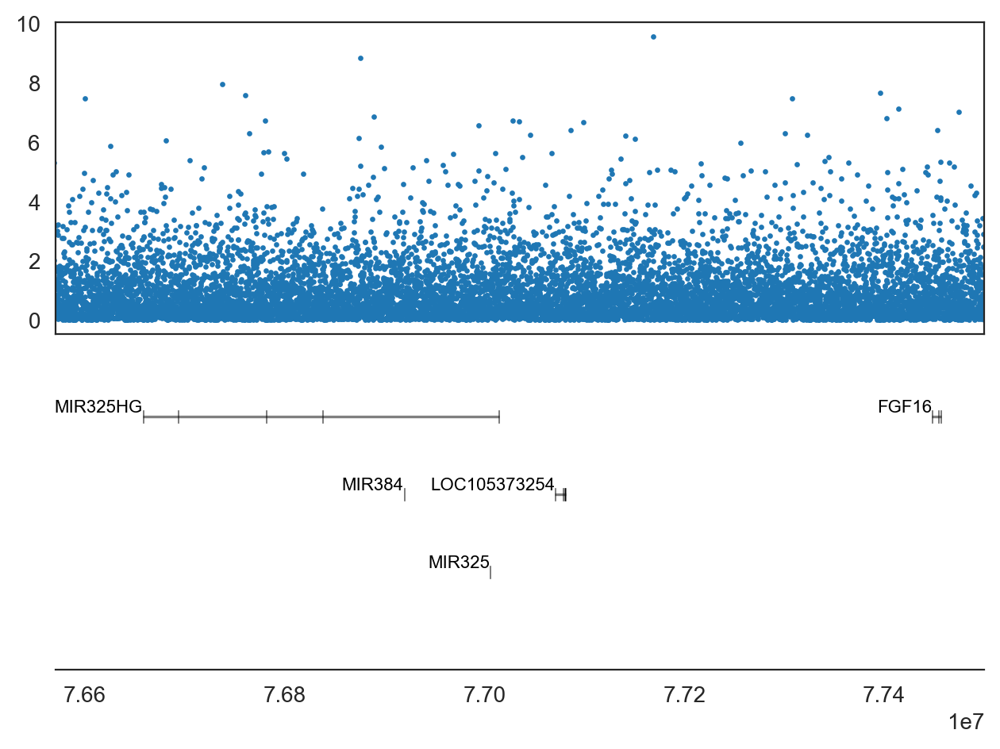

In [37]:
ax = gi.gene_plot('chrX', 76800000, 77500000, 'hg38')
ax.scatter(x, y, s=2)
plt.tight_layout()

**Same on older hg19 assembly:**

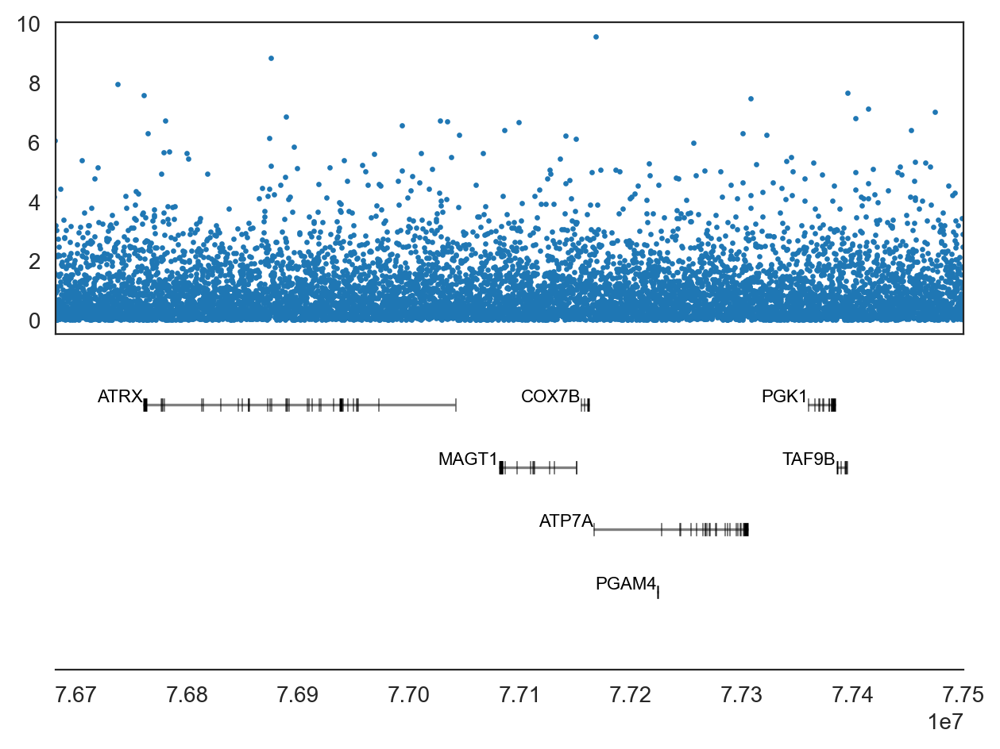

In [38]:
ax = gi.gene_plot('chrX', 76800000, 77500000, assembly='hg19')
ax.scatter(x, y, s=2)
plt.tight_layout()

**Two subplots for data:**

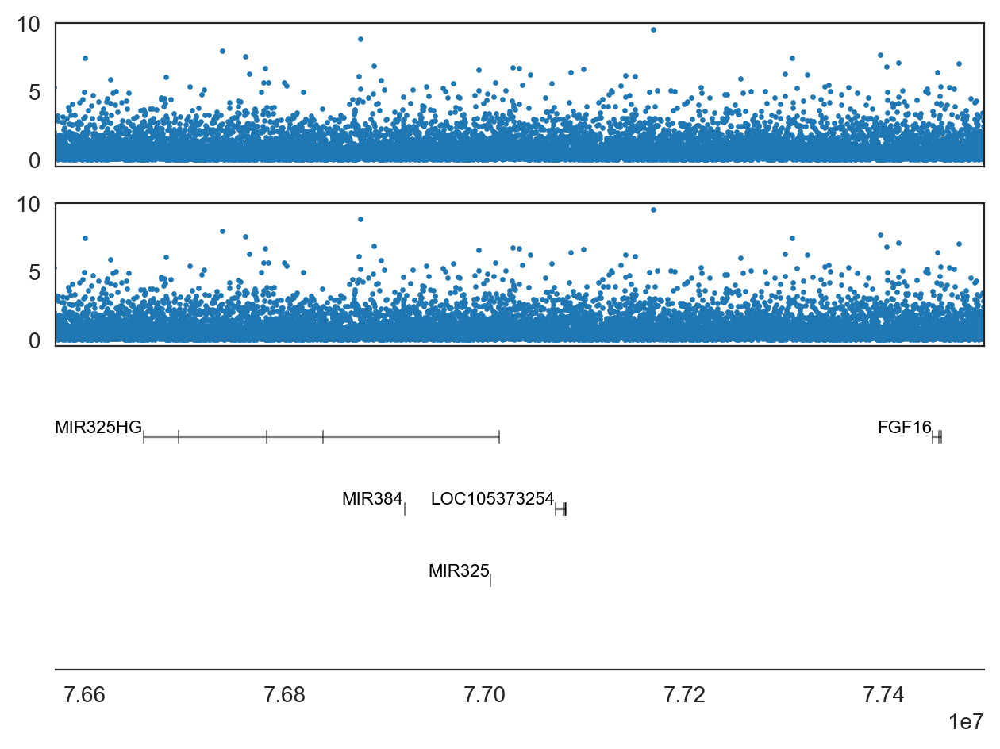

In [40]:
ax1, ax2 = gi.gene_plot('chrX', 76800000, 77500000, assembly='hg38', return_axes=2)
ax1.scatter(x, y, s=2)
ax2.scatter(x, y, s=2)
plt.tight_layout()

**Three subplots for data and adjusted aspect ratio:**

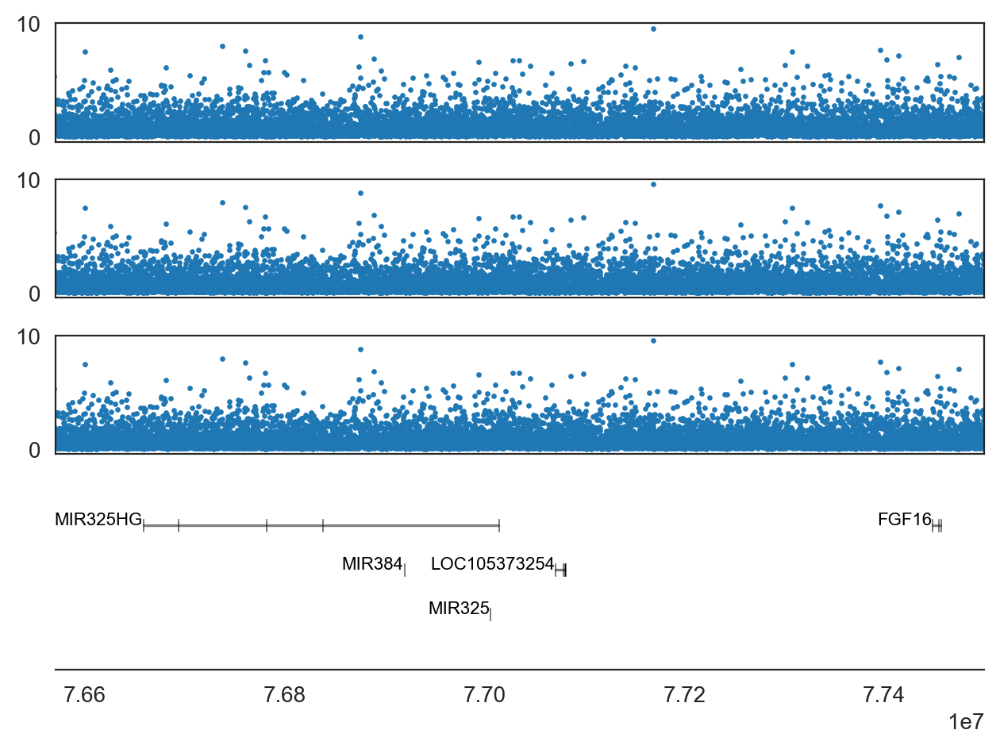

In [41]:
ax1, ax2, ax3 = gi.gene_plot('chrX', 76800000, 77500000, assembly='hg38', return_axes=3, aspect=0.5)
ax1.scatter(x, y, s=2)
ax2.scatter(x, y, s=2)
ax3.scatter(x, y, s=2)
plt.tight_layout()

**Highlight a list of genes:**

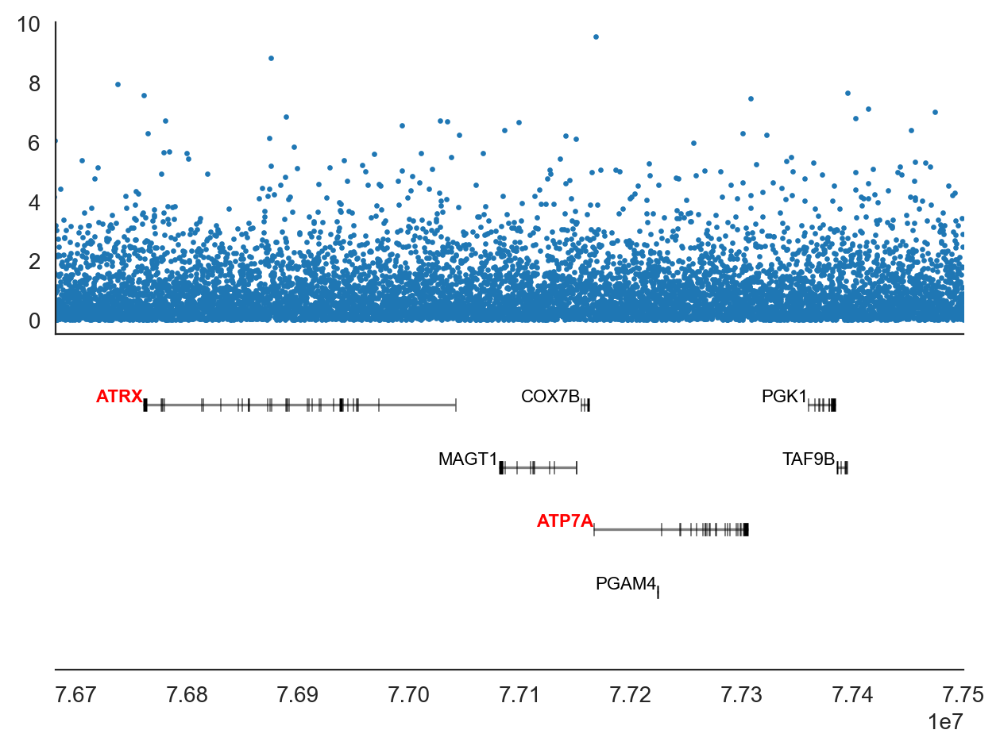

In [42]:
ax = gi.gene_plot('chrX', 76800000, 77500000, 'hg19', highlight=['ATRX', 'ATP7A'])
ax.scatter(x, y, s=2)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

**Combinatorial hightlighting:**

Combining text weight, style, color and bbox:

In [46]:
highlight = defaultdict(dict)
for gene in ['ATRX', 'COX7B', 'PGK1']:
    highlight[gene].update(dict(weight='bold'))
for gene in ['MAGT1']:
    highlight[gene].update(dict(style='italic'))
for gene in ['ATP7A', 'ATRX']:
    highlight[gene].update(dict(color='red'))
for gene in ['PGK1', 'ATRX']:
    highlight[gene].update(dict(bbox=dict(edgecolor='black', facecolor='none', linewidth=0.2)))


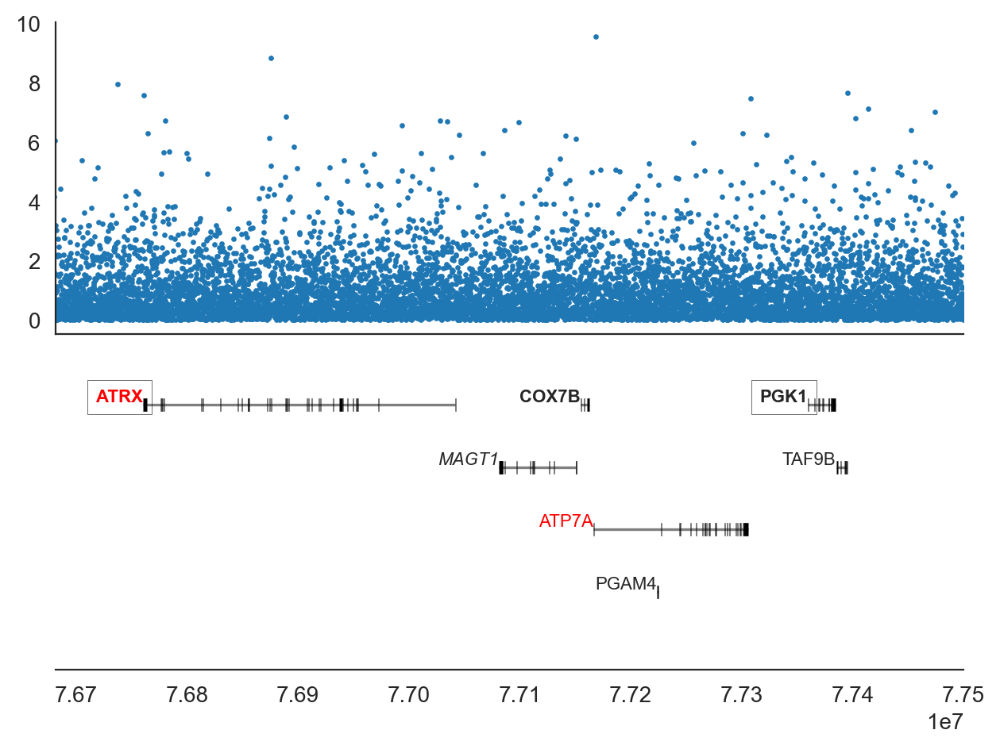

In [47]:
ax = gi.gene_plot('chrX', 76800000, 77500000, 'hg19', highlight=highlight)
ax.scatter(x, y, s=2)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

In [48]:
highlight = defaultdict(dict)
for gene in gene_list('xi_any_evidence'):
    highlight[gene].update(dict(weight='bold'))
for gene in gene_list('ech75_regions'):
    highlight[gene].update(dict(style='italic'))
for gene in gene_list('sfari_all_conf') + gene_list('intelect_disabil'):
    highlight[gene].update(dict(color='red'))
for gene in gene_list('gametologs') +  gene_list('mult_copy') + gene_list('xi_escape') + gene_list('cDEG') + gene_list('nDEG'):
    highlight[gene].update(dict(bbox=dict(edgecolor='black', facecolor='none', linewidth=0.2)))

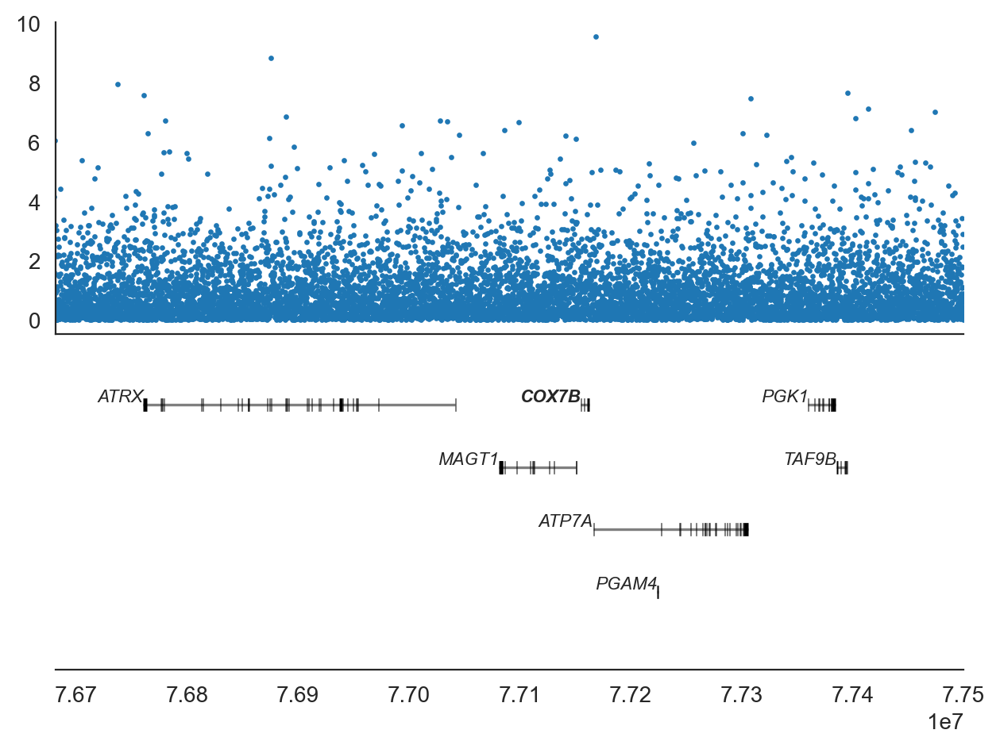

In [50]:
ax = gi.gene_plot('chrX', 76800000, 77500000, 'hg19', highlight=highlight)

ax.scatter(x, y, s=2)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

**Larger with colors:**

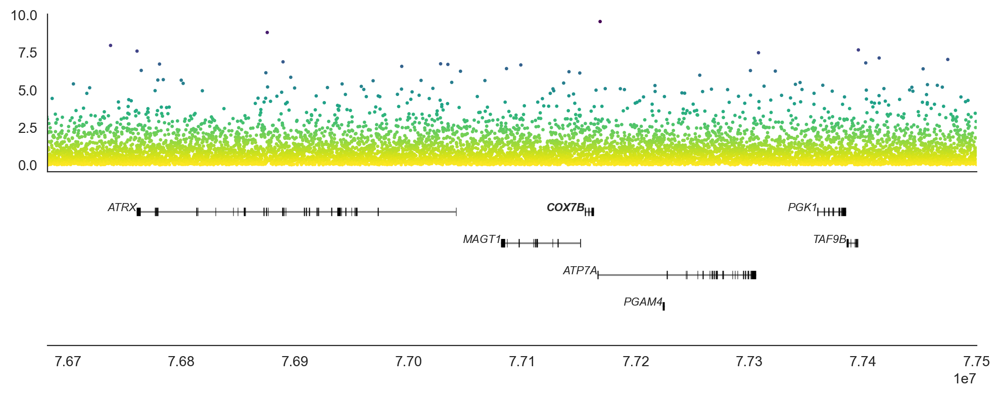

In [65]:
ax = gi.gene_plot('chrX', 76800000, 77500000, 'hg19', highlight=highlight, figsize=(10, 4))

ax.scatter(x, y, s=2, c=y, cmap='viridis_r')
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

**Other features:**

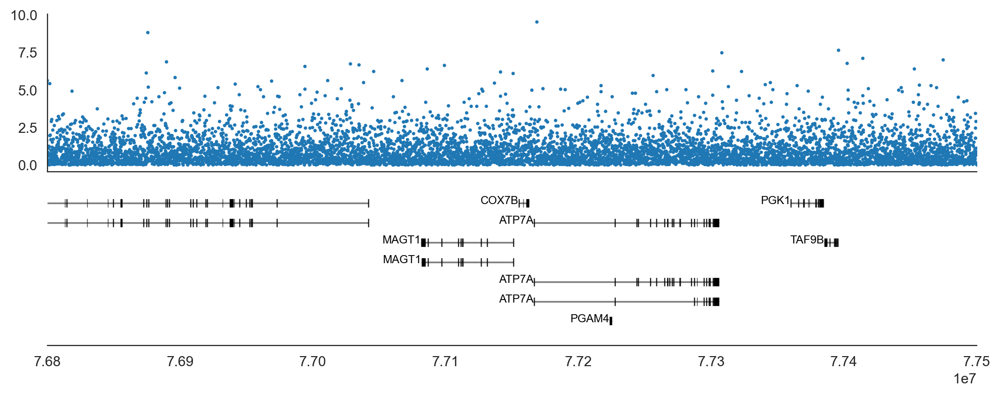

In [51]:
ax = gi.gene_plot('chrX', 76800000, 77500000, assembly='hg19',
                  figsize=(10, 4),          # larger figure
                  collapse_splice_var=False, # show all splice variants separately
                  exact_exons=False,        # allow exons to be wide enough to be visible on large plots
                  hard_limits=True,          # truncate genes that overlap the borders of the specified range
                 )

ax.scatter(x, y, s=2)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

# Show STRING interaction network

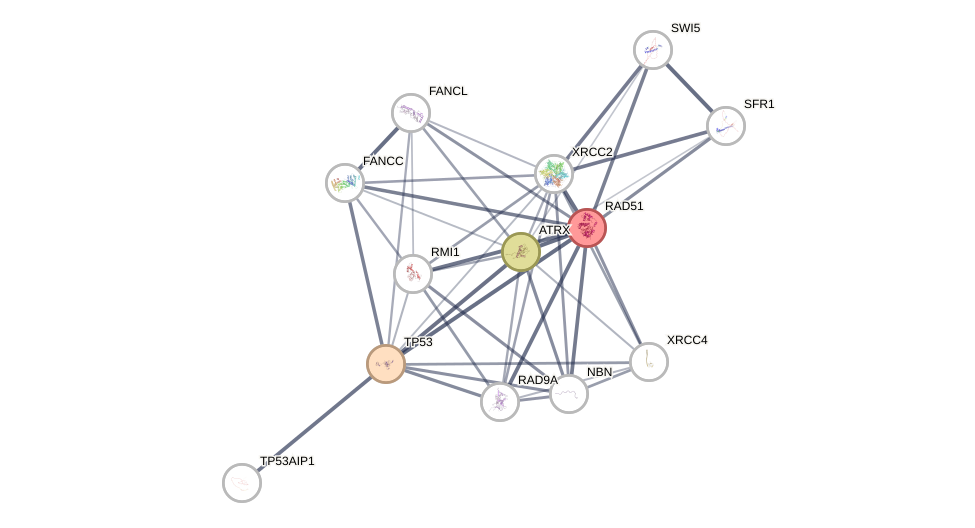

In [52]:
gi.show_string_network(['ATRX', 'TP53', 'RAD51'], nodes=10)

## Chromosome ideogram

In [53]:
# import importlib
# import geneinfo
# importlib.reload(geneinfo)

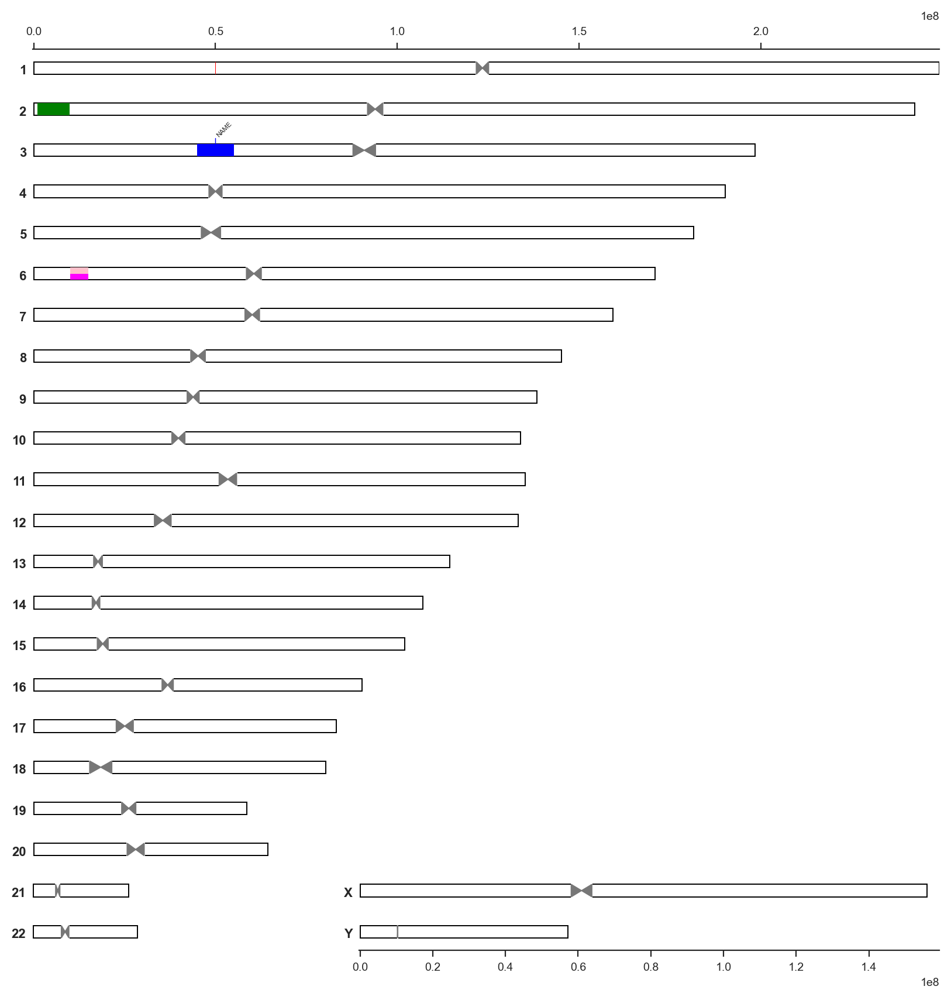

In [54]:
annotation = [
    ('chr1', 50000000, 50001000),                          # segment color defaults to red
    ('chr2', 10000000, 1000000, 'green'),                  # with segment color
    ('chr3', 45000000, 55000000, 'blue', 'NAME'),          # with name label
    ('chr6', 10000000, 15000000, 'magenta', None, 0, 0.5), # with base and height
    ('chr6', 10000000, 15000000, 'pink', None, 0.5, 0.5),  # with base and height
]

gi.chrom_ideogram(annotation)

To make sure segments are visible on the plot, the default minimal size of plotteed segments are 200000. This can be changed like this (notice how the chr1 segment is no longer visible):

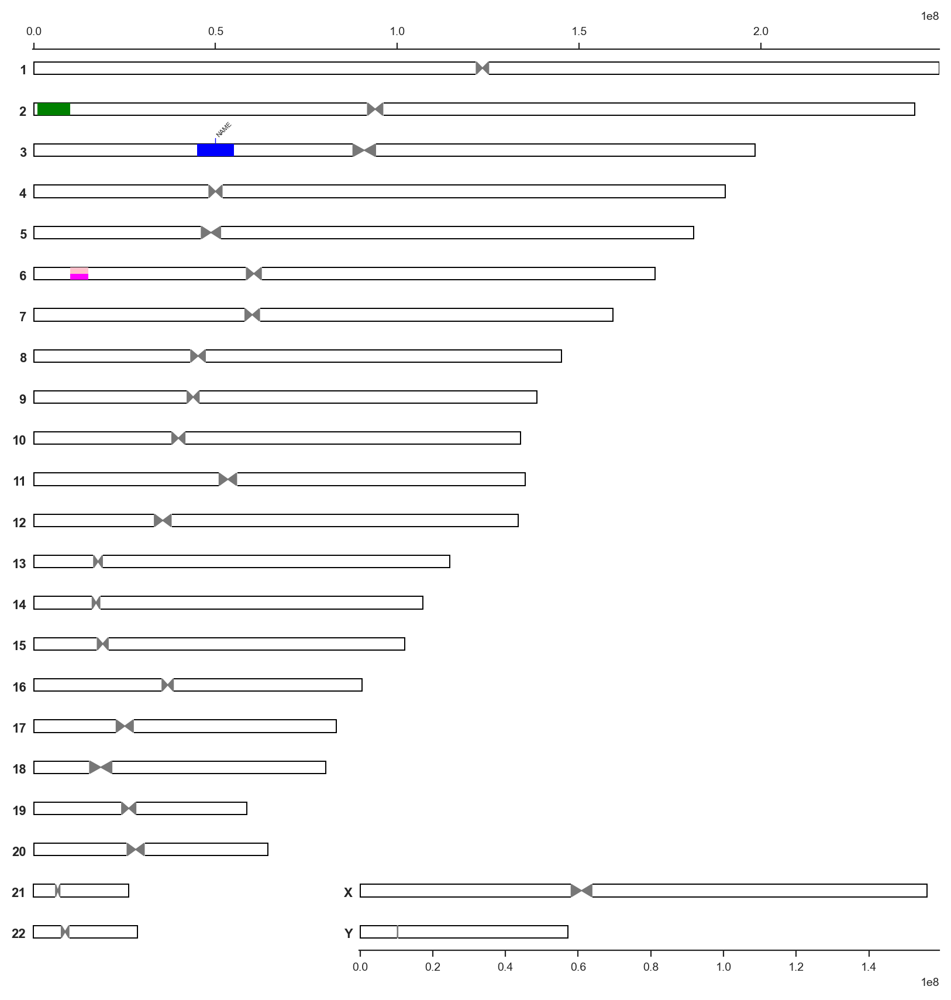

In [55]:
gi.chrom_ideogram(annotation, min_visible_width=1)

Other assembly, figure dimentions:

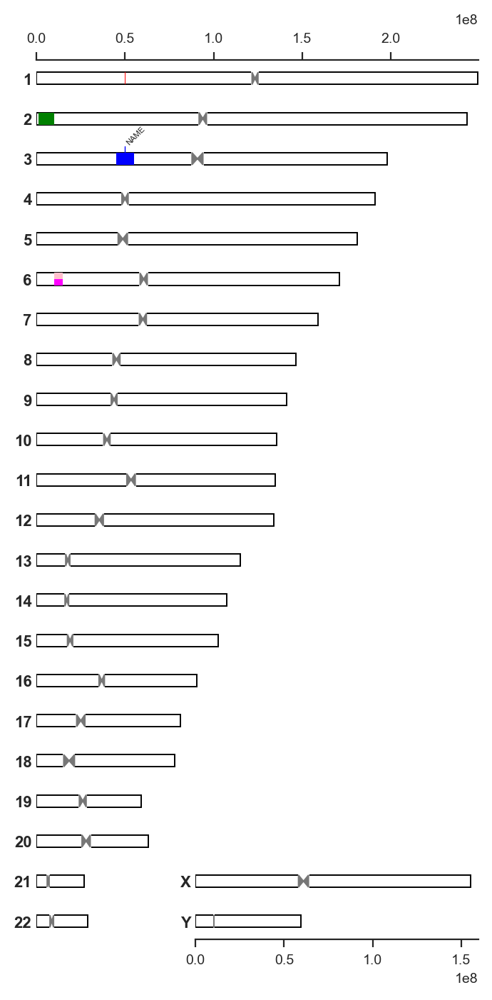

In [56]:
gi.chrom_ideogram(annotation, assembly='hg19', figsize=(4, 8))

**You can add position markers along a chromosome like this to better see the location of some segments:**

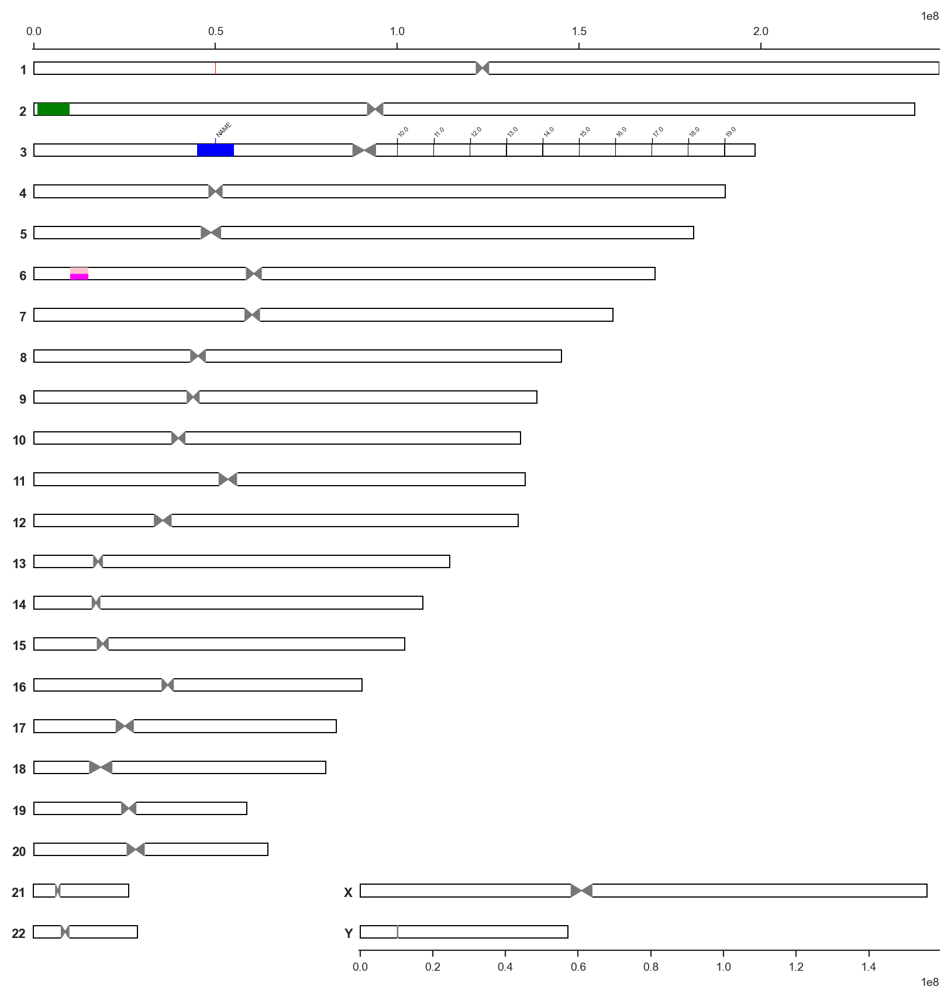

In [57]:
chrom = 'chr3'
start = 100000000
end = 200000000
width = 10000000
annotation2 = annotation + [(chrom, x[0], x[1], 'black', str(x[2]/width)) for x in zip(
    range(start, end, width), 
    range(start+1, end, width), 
    range(start, end, width)
)]
gi.chrom_ideogram(annotation2)

# Gene ontology information

**Get info for one or more GO terms:**

In [58]:
gi.go_info('GO:0000776')

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

In [3]:
gi.go_info(['GO:0000776', 'GO:0005634'])

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**Get GO terms for a one or more genes:**

In [4]:
go_terms = gi.get_go_terms_for_genes(['DYNLT3'])
go_terms[:10]

['GO:0000776',
 'GO:0005515',
 'GO:0005634',
 'GO:0005737',
 'GO:0005868',
 'GO:0007018',
 'GO:0007049',
 'GO:0007346',
 'GO:0042802',
 'GO:0045505']

**Descriptions for GO terms for one or more genes:**

In [5]:
gi.go_info(gi.get_go_terms_for_genes(['DYNLT3']))

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005868:</span>** **cytoplasmic dynein complex**  
 Any dynein complex with a homodimeric dynein heavy chain core that catalyzes movement along a microtubule. Cytoplasmic dynein complexes participate in many cytoplasmic transport activities in eukaryotes, such as mRNA localization, intermediate filament transport, nuclear envelope breakdown, apoptosis, transport of centrosomal proteins, mitotic spindle assembly, virus transport, kinetochore functions, and movement of signaling and spindle checkpoint proteins. Some complexes participate in intraflagellar transport. Subunits associated with the dynein heavy chain mediate association between dynein heavy chain and cargoes, and may include light chains and light intermediate chains.    

 ----

**<span style="color:gray;">GO:0007018:</span>** **microtubule-based movement**  
 A microtubule-based process that results in the movement of organelles, other microtubules, or other cellular components. Examples include motor-driven movement along microtubules and movement driven by polymerization or depolymerization of microtubules.    

 ----

**<span style="color:gray;">GO:0007049:</span>** **cell cycle**  
 The progression of biochemical and morphological phases and events that occur in a cell during successive cell replication or nuclear replication events. Canonically, the cell cycle comprises the replication and segregation of genetic material followed by the division of the cell, but in endocycles or syncytial cells nuclear replication or nuclear division may not be followed by cell division.    

 ----

**<span style="color:gray;">GO:0007346:</span>** **regulation of mitotic cell cycle**  
 Any process that modulates the rate or extent of progress through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0042802:</span>** **identical protein binding**  
 Binding to an identical protein or proteins.    

 ----

**<span style="color:gray;">GO:0045505:</span>** **dynein intermediate chain binding**  
 Binding to an intermediate chain of the dynein complex.    

 ----

**<span style="color:gray;">GO:0045931:</span>** **positive regulation of mitotic cell cycle**  
 Any process that activates or increases the rate or extent of progression through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0051301:</span>** **cell division**  
 The process resulting in division and partitioning of components of a cell to form more cells; may or may not be accompanied by the physical separation of a cell into distinct, individually membrane-bounded daughter cells.    

 ----

**<span style="color:gray;">GO:0061673:</span>** **mitotic spindle astral microtubule**  
 Any of the mitotic spindle microtubules that radiate in all directions from the spindle poles and are thought to contribute to the forces that separate the poles and position them in relation to the rest of the cell.    

 ----

# GO graphs

**Show the sub-graph for a list of GO terms:**

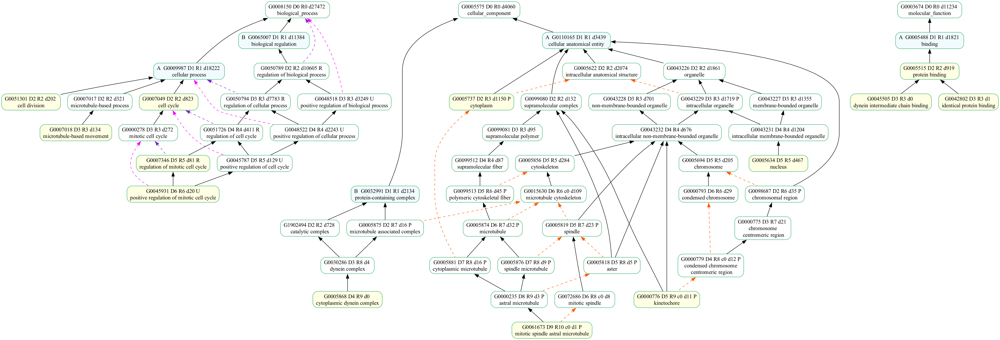

In [7]:
import geneinfo
import importlib
importlib.reload(geneinfo)
#geneinfo.go_info('GO:0000776')
geneinfo.show_go_dag_for_terms(go_terms)

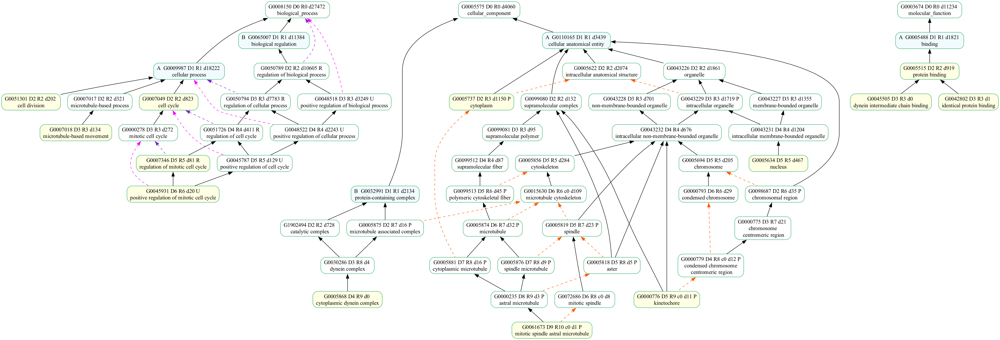

In [8]:
gi.show_go_dag_for_terms(go_terms)

**Show the sub-graph for the GO terms of a single gene:**

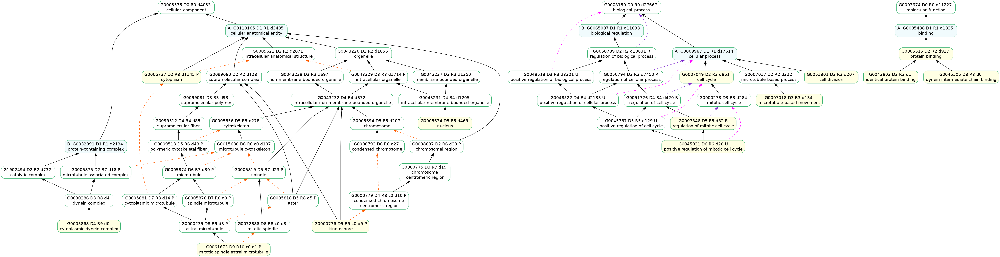

In [36]:
gi.show_go_dag_for_gene('DYNLT3')

**Same but using GO annotation backed by certain kinds of evidence:**

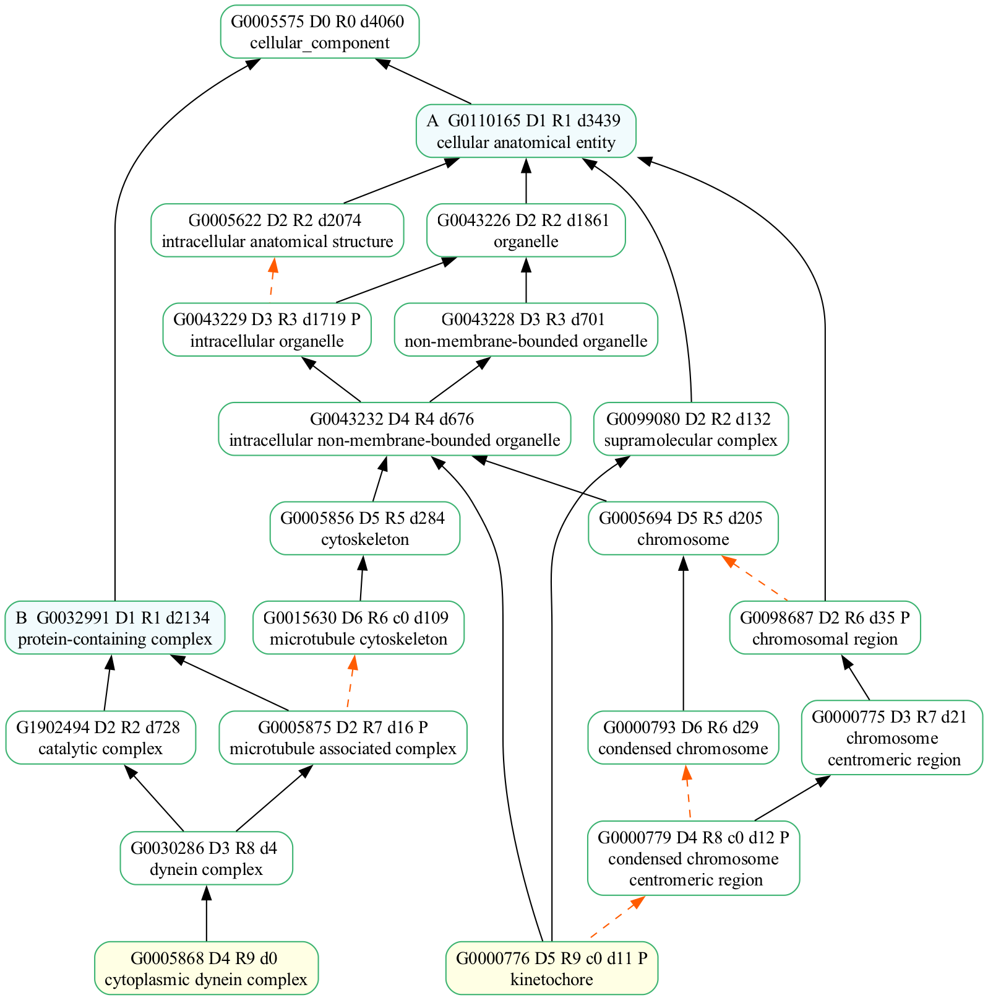

In [9]:
gi.show_go_dag_for_gene('DYNLT3', evidence=['IDA', 'EXP', 'HTP'])

**Show the categories of evidence backing GO annotations:**

In [38]:
gi.show_go_evidence_codes()


**Experimental evidence codes:** <br>
Inferred from Experiment (EXP) <br>
Inferred from Direct Assay (IDA) <br>
Inferred from Physical Interaction (IPI) <br>
Inferred from Mutant Phenotype (IMP) <br>
Inferred from Genetic Interaction (IGI) <br>
Inferred from Expression Pattern (IEP) <br>
Inferred from High Throughput Experiment (HTP) <br>
Inferred from High Throughput Direct Assay (HDA) <br>
Inferred from High Throughput Mutant Phenotype (HMP) <br>
Inferred from High Throughput Genetic Interaction (HGI) <br>
Inferred from High Throughput Expression Pattern (HEP) 

**Phylogenetically-inferred annotations:** <br>
Inferred from Biological aspect of Ancestor (IBA) <br>
Inferred from Biological aspect of Descendant (IBD) <br>
Inferred from Key Residues (IKR) <br>
Inferred from Rapid Divergence (IRD)

**Computational analysis evidence codes** <br>
Inferred from Sequence or structural Similarity (ISS) <br>
Inferred from Sequence Orthology (ISO) <br>
Inferred from Sequence Alignment (ISA) <br>
Inferred from Sequence Model (ISM) <br>
Inferred from Genomic Context (IGC) <br>
Inferred from Reviewed Computational Analysis (RCA)

**Author statement evidence codes:** <br>
Traceable Author Statement (TAS) <br>
Non-traceable Author Statement (NAS)

**Curator statement evidence codes:** <br>
Inferred by Curator (IC) <br>
No biological Data available (ND)

**Electronic annotation evidence code:** <br>
Inferred from Electronic Annotation (IEA)



# Find genes based on GO info

**Find genes matching a regular expression in any associated GO term description:**

In [39]:
motor_genes_df = gi.get_genes_for_go_regex('kinesin|dynein')
motor_genes_df.head() << left()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(comment def relationship synonym xref)
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(comment def relationship synonym xref)


,symbol,name,chrom,start,end
0,SPAG1,sperm associated antigen 1,8,100158037,100241903
1,BLOC1S2,biogenesis of lysosomal organelles complex 1 subunit 2,10,100286679,100273277
2,LZTS2,leucine zipper tumor suppressor 2,10,100996587,101007832
3,DYNC1H1,dynein cytoplasmic 1 heavy chain 1,14,101964572,102056442
4,KIF1B,kinesin family member 1B,1,10210569,10381602


# Global GO enrichment

**Enrichment against all GO terms with all protein coding genes as background:**

In [41]:
import importlib
import geneinfo
importlib.reload(geneinfo)

<module 'geneinfo' from '/home/kmt/geneinfo/geneinfo/__init__.py'>

In [42]:
go_results = gi.go_enrichment(motor_genes_df.symbol)
go_results.head(10)

Could not map symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005874,e,5.571187e-106,9.938998e-103,0.298193,0.014242,<GO:0005874>
1,BP,GO:0007018,e,9.897610e-106,1.225621e-101,0.183735,0.003197,<GO:0007018>
2,CC,GO:0005871,e,8.915899e-83,7.952981e-80,0.135542,0.002180,<GO:0005871>
3,MF,GO:0019894,e,6.377035e-81,2.925783e-77,0.132530,0.002131,<GO:0019894>
4,MF,GO:0008017,e,2.949550e-80,6.766267e-77,0.237952,0.012401,<GO:0008017>
5,CC,GO:0005813,e,3.219985e-74,1.914818e-71,0.292169,0.026353,<GO:0005813>
6,CC,GO:0032391,e,1.613030e-73,7.194114e-71,0.120482,0.001938,<GO:0032391>
7,MF,GO:0003777,e,3.646666e-70,5.576968e-67,0.126506,0.002325,<GO:0003777>
8,MF,GO:0045505,e,5.552945e-68,6.369227e-65,0.111446,0.001792,<GO:0045505>
9,CC,GO:0016235,e,3.865863e-66,1.379340e-63,0.108434,0.001744,<GO:0016235>


**Show GO DAG for enrichment results:**

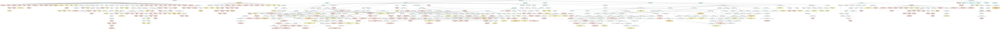

In [43]:
gi.show_go_dag_enrichment_results(go_results.obj)

**Same but only for top 10 GO terms:**

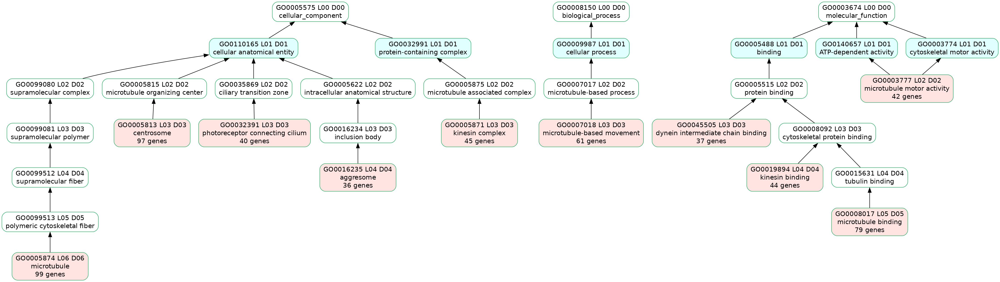

In [44]:
gi.show_go_dag_enrichment_results(go_results.obj[:10])

**Descriptions of the same 10 GO terms:**

In [45]:
gi.go_info(go_results.term_id[:10])

**<span style="color:gray;">GO:0005874:</span>** **microtubule**  
 Any of the long, generally straight, hollow tubes of internal diameter 12-15 nm and external diameter 24 nm found in a wide variety of eukaryotic cells; each consists (usually) of 13 protofilaments of polymeric tubulin, staggered in such a manner that the tubulin monomers are arranged in a helical pattern on the microtubular surface, and with the alpha/beta axes of the tubulin subunits parallel to the long axis of the tubule; exist in equilibrium with pool of tubulin monomers and can be rapidly assembled or disassembled in response to physiological stimuli; concerned with force generation, e.g. in the spindle.    

 ----

**<span style="color:gray;">GO:0007018:</span>** **microtubule-based movement**  
 A microtubule-based process that results in the movement of organelles, other microtubules, or other cellular components. Examples include motor-driven movement along microtubules and movement driven by polymerization or depolymerization of microtubules.    

 ----

**<span style="color:gray;">GO:0005871:</span>** **kinesin complex**  
 Any complex that includes a dimer of molecules from the kinesin superfamily, a group of related proteins that contain an extended region of predicted alpha-helical coiled coil in the main chain that likely produces dimerization. The native complexes of several kinesin family members have also been shown to contain additional peptides, often designated light chains as all of the noncatalytic subunits that are currently known are smaller than the chain that contains the motor unit. Kinesin complexes generally possess a force-generating enzymatic activity, or motor, which converts the free energy of the gamma phosphate bond of ATP into mechanical work.    

 ----

**<span style="color:gray;">GO:0019894:</span>** **kinesin binding**  
 Interacting selectively and non-covalently and stoichiometrically with kinesin, a member of a superfamily of microtubule-based motor proteins that perform force-generating tasks such as organelle transport and chromosome segregation.    

 ----

**<span style="color:gray;">GO:0008017:</span>** **microtubule binding**  
 Binding to a microtubule, a filament composed of tubulin monomers.    

 ----

**<span style="color:gray;">GO:0005813:</span>** **centrosome**  
 A structure comprised of a core structure (in most organisms, a pair of centrioles) and peripheral material from which a microtubule-based structure, such as a spindle apparatus, is organized. Centrosomes occur close to the nucleus during interphase in many eukaryotic cells, though in animal cells it changes continually during the cell-division cycle.    

 ----

**<span style="color:gray;">GO:0032391:</span>** **photoreceptor connecting cilium**  
 The portion of the photoreceptor cell cilium linking the photoreceptor inner and outer segments. It's considered to be equivalent to the ciliary transition zone.    

 ----

**<span style="color:gray;">GO:0003777:</span>** **microtubule motor activity**  
 A motor activity that generates movement along a microtubule, driven by ATP hydrolysis.    

 ----

**<span style="color:gray;">GO:0045505:</span>** **dynein intermediate chain binding**  
 Binding to an intermediate chain of the dynein complex.    

 ----

**<span style="color:gray;">GO:0016235:</span>** **aggresome**  
 An inclusion body formed by dynein-dependent retrograde transport of an aggregated protein on microtubules.    

 ----

**Show the GO DAG for a set of GO terms and their parent terms:**

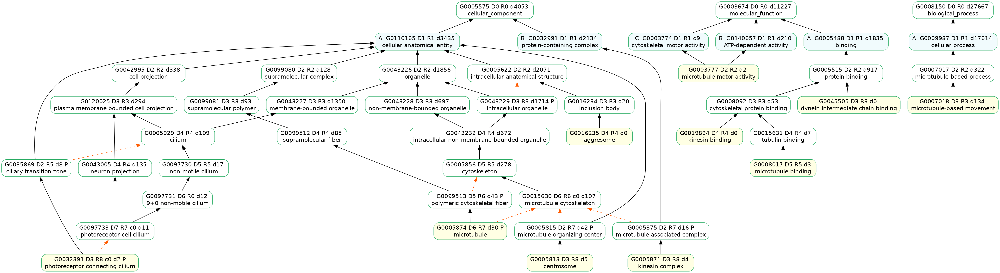

In [46]:
gi.show_go_dag_for_terms(go_results.term_id[:10])

**Specifying a custom set of background genes:**

The query genes should be a subset of the background genes:

In [48]:
all_protein_coding = set(pd.read_csv('geneinfo_cache/9606_protein_genes.txt', sep='\t').Symbol)
# only the first 50 genes:
subset_background = list(all_protein_coding)[:50] + motor_genes_df.symbol.tolist()

In [49]:
go_results = gi.go_enrichment(motor_genes_df.symbol, background_genes=subset_background)
go_results

Could not map symbol "KIF28P" to ncbi id
Could not map symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005874,e,2.236820e-07,0.000096,0.298193,0.260526,<GO:0005874>
1,CC,GO:0005813,e,5.400063e-06,0.001153,0.292169,0.257895,<GO:0005813>
2,MF,GO:0008017,e,1.118067e-05,0.004282,0.237952,0.207895,<GO:0008017>


**Use only the X chromosome as background:**

In [50]:
go_results = gi.go_enrichment(motor_genes_df.symbol, background_chrom='X')
go_results

Could not map symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,MF,GO:0045505,e,0.000041,0.010013,0.333333,0.002347,<GO:0045505>
1,MF,GO:0070840,e,0.000041,0.010013,0.333333,0.002347,<GO:0070840>
2,MF,GO:0008017,e,0.000031,0.010013,0.500000,0.012911,<GO:0008017>
3,CC,GO:0016235,e,0.000041,0.019985,0.333333,0.002347,<GO:0016235>


## Enrichment among a subset of GO terms

Extract terms matching regular expression:

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(comment def relationship synonym xref)


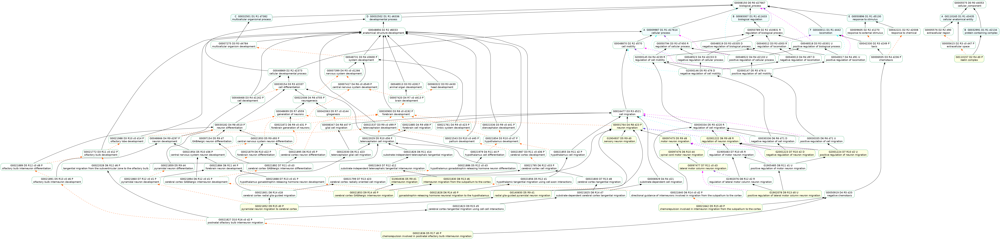

In [100]:
#target_terms = gi.get_terms_for_go_regex('brain')
#target_terms = gi.get_terms_for_go_regex('microtubul')
# target_terms = gi.get_terms_for_go_regex('spindle')
target_terms = gi.get_terms_for_go_regex(r'neuron\S* migration')
gi.show_go_dag_for_terms(target_terms)

In [101]:
go_results = gi.go_enrichment(motor_genes_df.symbol, terms=target_terms, list_study_genes=True)
go_results.head()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(def relationship)


Could not map symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0005615,p,0.000031,0.000157,0.021084,0.074795,<GO:0005615>,"[ACTB, BLOC1S1, HSPA1A, SNCA, LRP8, DYNC2I1, T..."
1,CC,GO:0032991,e,0.000257,0.000643,0.069277,0.030373,<GO:0032991>,"[ACTB, HTT, HNRNPU, HSPA1A, HSPA1B, HSP90AB1, ..."
2,BP,GO:0001764,e,0.000297,0.024316,0.024096,0.005086,<GO:0001764>,"[BBS4, PAFAH1B1, PCM1, PSEN1, DISC1, DCDC2, ND..."
3,BP,GO:0140650,e,0.000765,0.031383,0.006024,0.000145,<GO:0140650>,"[PAFAH1B1, NDEL1]"


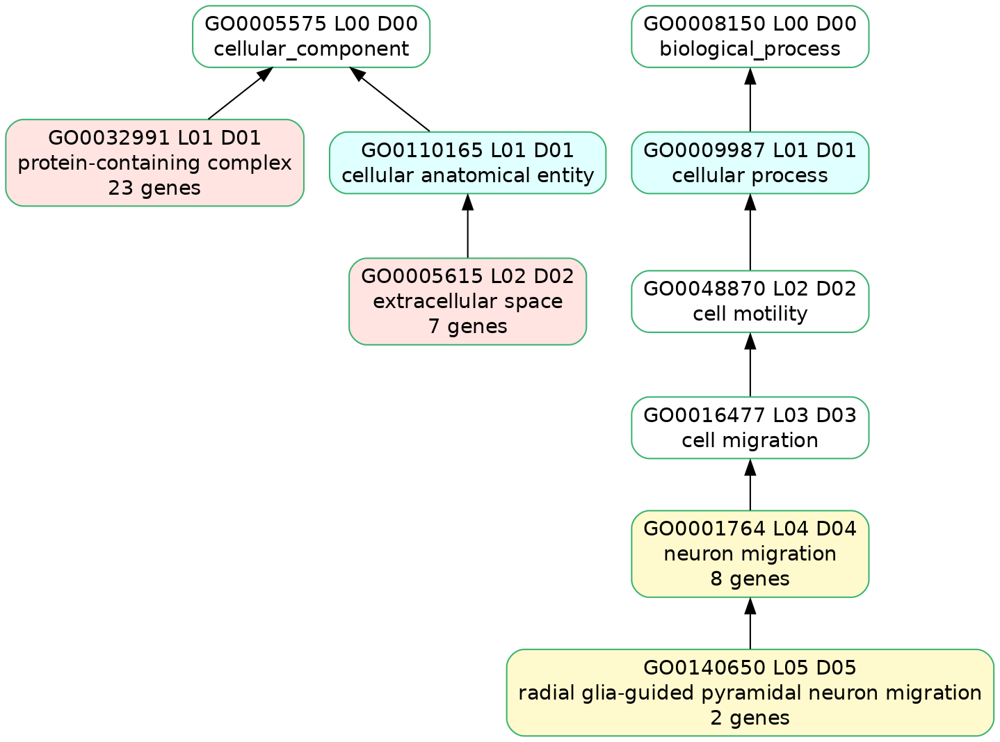

In [102]:
gi.show_go_dag_enrichment_results(go_results.obj)

Extract terms matching two regular expressions in any order:

In [103]:
pattern_one = r'microtub\S*'
pattern_two = r'spindle'
regex = fr"(?=.*({pattern_one}))(?=.*({pattern_two}))(?=.*)"

target_terms = gi.get_terms_for_go_regex(regex)
gi.show_go_dag_for_terms(target_terms)

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(comment def relationship synonym xref)


In [104]:
go_results = gi.go_enrichment(motor_genes_df.symbol, terms=target_terms, list_study_genes=True)
go_results.head()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2023-06-11) 46,420 Terms; optional_attrs(def relationship)


Could not map symbol "KIF28P" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0005874,e,5.571187e-106,2.562746e-104,0.298193,0.014242,<GO:0005874>,"[APC, KIF1A, CENPE, DCTN1, DNAH5, DNAH6, DNAH8..."
1,BP,GO:0007018,e,9.897610e-106,1.088737e-103,0.183735,0.003197,<GO:0007018>,"[KIF1A, CENPE, DNAH6, DNAH8, DYNC1I2, DYNC1LI2..."
2,CC,GO:0005813,e,3.219985e-74,7.405966e-73,0.292169,0.026353,<GO:0005813>,"[APC, ARL3, BBS4, BICD1, CENPF, CETN1, CETN2, ..."
3,CC,GO:0005868,e,2.588405e-42,3.968887e-41,0.069277,0.001114,<GO:0005868>,"[DYNC1H1, DYNC1I1, DYNC1I2, DYNC1LI2, DYNLT3, ..."
4,CC,GO:0030286,e,4.972519e-35,5.718397e-34,0.057229,0.000920,<GO:0030286>,"[DCTN1, DNAH6, DNAH9, DYNC1H1, DYNC1I2, DYNC1L..."


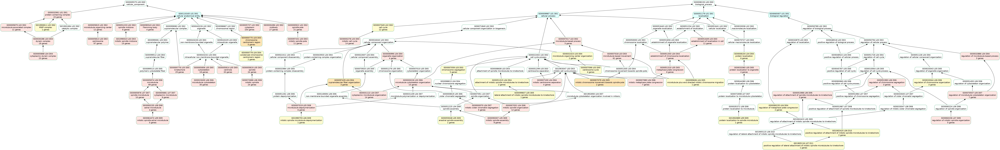

In [105]:
gi.show_go_dag_enrichment_results(go_results.obj)